# **How severe is an insurance claim?**

### Business Objectives
You must predict the value for the 'loss' column. Variables prefaced with 'cat' are categorical, while those prefaced with 'cont' are continuous.

### Data Mining Goals
The objective is to use supervised learning technical for understand how severe is an insurance claim.

---

## **Prepare Environment**

<br/>

### Imports

In [51]:
# data analysis and data wrangling
import numpy as np
import pandas as pd

# plotting
import seaborn as sns
import matplotlib.pyplot as plt

# PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# Preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier  # enbedded method

# machine learning
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
import xgboost as xgb

# metrics
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import KFold

# Other
from IPython.display import Image
import configparser
import subprocess
import warnings
import pprint
import time
import os

<br/>

### Prepare Principal Directory

In [52]:
def path_to_work(end_directory: str='notebooks'):
    curr_dir = os.path.dirname(os.path.realpath ("__file__")) 
    
    if curr_dir.endswith(end_directory):
        os.chdir('..')
        return f'Change directory to: {curr_dir}'
    
    return f'Current working directory: {curr_dir}'

In [53]:
path_to_work(end_directory='notebooks')

'Current working directory: /home/campos/projects/allstate-claims-severity'

<br/>

### Set Config 

In [54]:
# Visualization inside the jupyter
%matplotlib inline

# Load the "autoreload" extension so that code can change
%load_ext autoreload

# ----------
# Plot
# ----------
# graph style
sns.set_style("darkgrid")
plt.style.use('fivethirtyeight')

# ----------
# Seaborn rcParams
# ----------
rc={'savefig.dpi': 500, 
    'figure.autolayout': True, 
    'figure.figsize': [17, 12], 
    'axes.labelsize': 18,
    'axes.titlesize': 18, 
    'font.size': 10, 
    'lines.linewidth': 1.0, 
    'lines.markersize': 8, 
    'legend.fontsize': 15,
    'xtick.labelsize': 15, 
    'ytick.labelsize': 15}
    
# ----------
# Pandas
# ----------
# Floating point
pd.options.display.float_format = '{:.2f}'.format

# Print xxxx rows and all columns
pd.set_option('display.max_rows', 300)
pd.set_option('display.max_columns', None)

# ----------
# Python
# ----------
# pretty print
pp = pprint.PrettyPrinter(indent=4)

# Supress unnecessary warnings so that presentation looks clean
warnings.filterwarnings('ignore')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


---

## **Data Understanding**

### Collect Initial Data
The data set to be explored is the Allstate Claims Severity hosted in [Kaggle Competition](https://www.kaggle.com/c/allstate-claims-severity/data)

### File Descriptions
- `train.csv` - the training set
- `test.csv` - the test set. You must predict the loss value for the ids in this file.
- `sample_submission.csv` - a sample submission file in the correct format

<br/>

### Load Data

In [55]:
%%time

df_train = pd.read_csv("data/raw/train.csv", 
                       encoding='utf-8')
df_test = pd.read_csv("data/raw/test.csv", 
                      encoding='utf-8')

CPU times: user 3.42 s, sys: 176 ms, total: 3.6 s
Wall time: 3.6 s


<br/>

### **Describe Data**

In [56]:
# Size and types of the dataframe
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(1), object(116)
memory usage: 189.7+ MB


In [57]:
print("Dataframe:\n{} rows\n{} columns"
      .format(df_train.shape[0],
              df_train.shape[1]))

Dataframe:
188318 rows
132 columns


In [58]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125546 entries, 0 to 125545
Columns: 131 entries, id to cont14
dtypes: float64(14), int64(1), object(116)
memory usage: 125.5+ MB


In [59]:
print("Dataframe:\n{} rows\n{} columns"
      .format(df_test.shape[0],
              df_test.shape[1]))

Dataframe:
125546 rows
131 columns


#### Data Type
Within _data_ there are 3 types of data: <br/>
- float64(15) = continuos_feature + loss
- int64(1) = id
- object(116) = categorical_feature

In [60]:
df_train.head(2)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,B,D,D,B,D,C,B,D,B,A,A,A,A,A,D,B,C,E,A,C,T,B,G,A,A,I,E,G,J,G,BU,BC,C,AS,S,A,O,LB,0.73,0.25,0.19,0.79,0.31,0.72,0.34,0.30,0.67,0.84,0.57,0.59,0.82,0.71,2213.18
1,2,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,A,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,L,F,A,A,E,E,I,K,K,BI,CQ,A,AV,BM,A,O,DP,0.33,0.74,0.59,0.61,0.89,0.44,0.44,0.60,0.35,0.44,0.34,0.37,0.61,0.30,1283.60


In [61]:
# Types data in collumns
print(df_train.columns)

Index(['id', 'cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7', 'cat8',
       'cat9',
       ...
       'cont6', 'cont7', 'cont8', 'cont9', 'cont10', 'cont11', 'cont12',
       'cont13', 'cont14', 'loss'],
      dtype='object', length=132)


**NOTES**

Features in `train.csv` and `test.csv`: 
 - **id:** the id of a couple of questions from the training set
 - **cat1 to cat116:** category variables (the range of values is not provided, nor the column names).
 - **cont1 to cont14:** continuous variables (the range of values is not provided nor the names of the columns).
 - **loss:** the amount that the company has to pay for a particular claim. This is the target variable.
 > NOTE: In `test.csv`, the loss is not present, since we will predict this.

### **Explore Data**
First, let's explore what the column types are.

In [62]:
list_columns = []
list_categorical_col = []
list_numerical_col = []

In [63]:
def get_col(df: pd.core.frame.DataFrame, type_descr: 'numpy') -> list:
    """
    Function get list columns 
    
    Args:
    type_descr
        np.number, np.object -> return list with all columns
        np.number            -> return list numerical columns 
        np.object            -> return list object columns
    """
    try:
        col = (df.describe(include=type_descr).columns) 
    except ValueError:
        print(f'Dataframe not contains {type_descr} columns !', end='\n')    
    else:
        return col.tolist() 

In [64]:
list_numerical_col = get_col(df=df_train,
                             type_descr=np.number)
list_categorical_col = get_col(df=df_train,
                               type_descr=np.object)
list_columns = get_col(df=df_train,
                       type_descr=[np.object, np.number])

#### Measure Location

In [65]:
def show_measures_location(df: pd.core.frame.DataFrame, type_descr: list) -> None:
    """
    Function get measures localization
    Handler when type data not exists
    
    Args:
    type_descr
        np.number, np.object  -> return summary statistic with all columns
        np.number             -> return summary statistic numerical columns 
        np.object             -> return summary statistic object columns
    """
    try:
        col = (df.describe(include=type_descr).columns)
    except ValueError:
        print(f'Dataframe not contains {type_descr} columns !', end='\n\n')    
    else:
        list_col = col.tolist()
        percentage = (len(list_col) / df.shape[1]) * 100
        
        print("-"*25, "MEASURES OF LOCALIZATION", "-"*25, end='\n\n')
        print(f"TOTAL columns {type_descr}: {len(list_col)}")
        print("PERCENTAGE {} in dataframe: {:3.4} %".format(type_descr, percentage))
        
        return df.describe(include=type_descr)

In [66]:
show_measures_location(df=df_train,
                       type_descr=[np.number, np.object])

------------------------- MEASURES OF LOCALIZATION -------------------------

TOTAL columns [<class 'numpy.number'>, <class 'object'>]: 132
PERCENTAGE [<class 'numpy.number'>, <class 'object'>] in dataframe: 100.0 %


,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.00,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00
unique,NaN,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,8,7,8,7,5,7,5,8,7,5,16,15,19,9,13,17,20,17,20,11,84,131,16,51,61,19,23,326,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,D,C,E,C,A,P,F,A,A,A,E,E,G,F,B,BI,CL,A,E,BM,A,K,HK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,141550,106721,177993,128395,123737,131693,183744,177274,113122,160213,168186,159825,168851,186041,188284,181843,187009,187331,186510,188114,187905,188275,157445,181977,169969,177119,168250,180938,184593,184760,182980,187107,187361,187734,188105,156313,165729,169323,183393,180119,181177,186623,184110,172716,183991,187436,187617,188049,179127,137611,187071,179505,172949,183762,188173,188136,185296,188079,188018,187872,187596,188273,188239,188271,186056,179982,187626,188176,188011,188295,178646,118322,154275,184731,154307,181347,187503,186526,152929,137505,154385,147536,141534,154939,186005,103852,166992,168926,183744,177993,111028,124689,150237,121642,87531,174360,78127,105492,79455,42970,106721,177274,123737,42925,76493,47165,47310,65512,152918,25305,128395,25148,26191,131693,43866,21061,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,294135.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.49,0.51,0.50,0.49,0.49,0.49,0.48,0.49,0.49,0.50,0.49,0.49,0.49,0.50,3037.34
std,169336.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [67]:
show_measures_location(df=df_train,
                       type_descr=[np.number])

------------------------- MEASURES OF LOCALIZATION -------------------------

TOTAL columns [<class 'numpy.number'>]: 16
PERCENTAGE [<class 'numpy.number'>] in dataframe: 12.12 %


,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00,188318.00
mean,294135.98,0.49,0.51,0.50,0.49,0.49,0.49,0.48,0.49,0.49,0.50,0.49,0.49,0.49,0.50,3037.34
std,169336.08,0.19,0.21,0.20,0.21,0.21,0.21,0.18,0.20,0.18,0.19,0.21,0.21,0.21,0.22,2904.09
min,1.00,0.00,0.00,0.00,0.18,0.28,0.01,0.07,0.24,0.00,0.00,0.04,0.04,0.00,0.18,0.67
25%,147748.25,0.35,0.36,0.34,0.33,0.28,0.34,0.35,0.31,0.36,0.36,0.31,0.31,0.32,0.29,1204.46
50%,294539.50,0.48,0.56,0.53,0.45,0.42,0.44,0.44,0.44,0.44,0.46,0.46,0.46,0.36,0.41,2115.57
75%,440680.50,0.62,0.68,0.63,0.65,0.64,0.66,0.59,0.62,0.57,0.61,0.68,0.68,0.69,0.72,3864.05
max,587633.00,0.98,0.86,0.94,0.95,0.98,1.00,1.00,0.98,1.00,0.99,1.00,1.00,0.99,0.84,121012.25


In [68]:
show_measures_location(df=df_train,
                       type_descr=[np.object])

------------------------- MEASURES OF LOCALIZATION -------------------------

TOTAL columns [<class 'object'>]: 116
PERCENTAGE [<class 'object'>] in dataframe: 87.88 %


,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116
count,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318
unique,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,8,7,8,7,5,7,5,8,7,5,16,15,19,9,13,17,20,17,20,11,84,131,16,51,61,19,23,326
top,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,D,C,E,C,A,P,F,A,A,A,E,E,G,F,B,BI,CL,A,E,BM,A,K,HK
freq,141550,106721,177993,128395,123737,131693,183744,177274,113122,160213,168186,159825,168851,186041,188284,181843,187009,187331,186510,188114,187905,188275,157445,181977,169969,177119,168250,180938,184593,184760,182980,187107,187361,187734,188105,156313,165729,169323,183393,180119,181177,186623,184110,172716,183991,187436,187617,188049,179127,137611,187071,179505,172949,183762,188173,188136,185296,188079,188018,187872,187596,188273,188239,188271,186056,179982,187626,188176,188011,188295,178646,118322,154275,184731,154307,181347,187503,186526,152929,137505,154385,147536,141534,154939,186005,103852,166992,168926,183744,177993,111028,124689,150237,121642,87531,174360,78127,105492,79455,42970,106721,177274,123737,42925,76493,47165,47310,65512,152918,25305,128395,25148,26191,131693,43866,21061


---

## **Data Preparation: Cleaning**

<br/>

### **Convert Types**

- categorical string values to numeric values

There are 116 categories with non alphanumeric values, most of the machine learning algorithms doesn't work with alpha numeric values. So, lets convert it into numeric values

In [69]:
# convert the categorical variables into numbers
df_train[list_categorical_col] = df_train.copy().loc[:, list_categorical_col]

for cat_feat in df_train[list_categorical_col].columns:
    df_train[cat_feat] = pd.factorize(df_train[cat_feat], sort=True)[0]

In [70]:
df_train.head(2)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,1,1,3,3,1,3,2,1,3,1,0,0,0,0,0,3,1,2,4,0,2,15,1,6,0,0,8,4,6,9,6,45,28,2,19,55,0,14,269,0.73,0.25,0.19,0.79,0.31,0.72,0.34,0.30,0.67,0.84,0.57,0.59,0.82,0.71,2213.18
1,2,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,0,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,11,5,0,0,4,4,8,10,10,33,65,0,22,38,0,14,85,0.33,0.74,0.59,0.61,0.89,0.44,0.44,0.60,0.35,0.44,0.34,0.37,0.61,0.30,1283.60


In [71]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(117)
memory usage: 189.7 MB


In [72]:
#df_test

# convert the categorical variables into numbers
df_test[list_categorical_col] = df_test.copy().loc[:, list_categorical_col]

for cat_feat in df_test[list_categorical_col].columns:
    df_test[cat_feat] = pd.factorize(df_test[cat_feat], sort=True)[0]

In [73]:
df_test.head(2)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
0,4,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,1,1,2,1,3,1,0,0,0,0,0,3,2,2,4,2,3,15,7,6,0,0,6,4,8,11,10,30,26,0,35,23,0,16,169,0.32,0.30,0.25,0.40,0.28,0.47,0.32,0.61,0.34,0.38,0.38,0.37,0.70,0.39
1,6,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,3,1,1,3,3,1,1,2,1,1,1,0,0,0,0,0,3,3,3,4,0,0,12,1,3,0,0,6,6,6,5,1,30,58,3,32,58,0,11,173,0.63,0.62,0.65,0.95,0.84,0.48,0.44,0.71,0.52,0.60,0.69,0.68,0.45,0.21


In [74]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125546 entries, 0 to 125545
Columns: 131 entries, id to cont14
dtypes: float64(14), int64(117)
memory usage: 125.5 MB


<br/>

### **Verify Data Quality**
- Check index
- Check for missing values
- Check for missing data in the cells
- Check for duplicate values
- Check for irrelevant values
- Check for outliers

<br/>

### Check Index

In [75]:
df_train.index

RangeIndex(start=0, stop=188318, step=1)

**NOTE**
<br/>
- The dataset has no missing index values, so there are no missing lines.
- The total number of rows matches what was reported at the source.

<br/>

### Remove id (index)

It can not be removed because the index value for kaggle will be used.

<br/>

### Check Missing Values

In [76]:
# isnull()

def check_if_contains_missing_val(df: pd.core.frame.DataFrame):
    """
    Return TRUE, if collumn contains values missing
    """
    list_columns_missing = []
    
    for index, value in enumerate(df.isnull().any()):
        if value is True:
            list_columns_missing.append(df.columns[index])
    
    if len(list_columns_missing) > 0:
        print("Columns's name with missing values:")
        return list_columns_missing   
    
    print("The dataframe NOT contains missing values.")
    return 0

In [77]:
list_columns_m_v = check_if_contains_missing_val(df_train)

display(list_columns_m_v)  # display show one column by line

The dataframe NOT contains missing values.


0

**NOTE**
<br/>
The dataset has no missing values in its cells, so there is no missing data.

<br/>

### Check Duplicated Values

In [78]:
# duplicated()

def check_quat_duplicated_data(df: pd.core.frame.DataFrame) -> None:
    """
    Check if contains duplicated data.Mark duplicates as ``True`` if enough row equal.
    Exclude for the first occurrence.    
    """
    duplicated = df.duplicated().sum()
    total_lines = df.shape[0]
    percentage = (duplicated/total_lines) * 100
    
    print("-"*25, "DUPLICATED DATA", "-"*25,)
    print("\nSHAPE of data: {}".format(df.shape[0]))
    print("TOTAL duplicated data: {}".format(duplicated))
    print("PERCENTAGE duplicated data: {:3.2} %".format(percentage)) 

In [79]:
check_quat_duplicated_data(df_train)

------------------------- DUPLICATED DATA -------------------------

SHAPE of data: 188318
TOTAL duplicated data: 0
PERCENTAGE duplicated data: 0.0 %


<br/>

### Check for irrelevant values
- Irrelevant observations are those that **don’t actually fit the specific problem** that you’re trying to solve.
- It is necessary to analyze the content of the data to see if it's really relevant and also fit the column it.

In [80]:
# unique()

def show_categorical_values(df: pd.core.frame.DataFrame, *columns: list) -> None:
    for column in columns:
        list_unique = df[column].unique()
        print(f"The categorical column {column} contains this values:\n\n{list_unique}\n")

In [81]:
show_categorical_values(df_train, *list_categorical_col)

The categorical column cat1 contains this values:

[0 1]

The categorical column cat2 contains this values:

[1 0]

The categorical column cat3 contains this values:

[0 1]

The categorical column cat4 contains this values:

[1 0]

The categorical column cat5 contains this values:

[0 1]

The categorical column cat6 contains this values:

[0 1]

The categorical column cat7 contains this values:

[0 1]

The categorical column cat8 contains this values:

[0 1]

The categorical column cat9 contains this values:

[1 0]

The categorical column cat10 contains this values:

[0 1]

The categorical column cat11 contains this values:

[1 0]

The categorical column cat12 contains this values:

[0 1]

The categorical column cat13 contains this values:

[0 1]

The categorical column cat14 contains this values:

[0 1]

The categorical column cat15 contains this values:

[0 1]

The categorical column cat16 contains this values:

[0 1]

The categorical column cat17 contains this values:

[0 1]

The ca

**NOTES**
<br/>
All categories are consistent with their respective columns.

<br/>

### Outliers

In [82]:
print(df_test.skew()[:10])

id     -0.00
cat1    1.15
cat2    0.27
cat3    3.94
cat4    0.80
cat5    0.65
cat6    0.88
cat7    6.23
cat8    3.74
cat9    0.41
dtype: float64


In [83]:
# quantile()

dict_quantile = {}


def calculate_quantile_by_col(df: pd.core.frame.DataFrame, *columns: list) -> None:
    """
    Calculate boxplot
    """
    for column in columns:
        dict_col = {}
       
        q1 = df[column].quantile(0.25)
        q3 = df[column].quantile(0.75)
        iqr = q3 - q1  # Interquartile range

        dict_col[column] = {'q1': q1,
                            'q3': q3,
                            'iqr': iqr}
        # add dict column in principal dict
        dict_quantile.update(dict_col)

Get 11554 outliers by column. 

In this context, outliers are important to analysis, so them ar not removed.

In [84]:
# run
calculate_quantile_by_col(df_train, *list_numerical_col)

In [85]:
pp.pprint(dict_quantile)

{   'cont1': {'iqr': 0.277822, 'q1': 0.34609, 'q3': 0.623912},
    'cont10': {'iqr': 0.25000999999999995, 'q1': 0.36458, 'q3': 0.61459},
    'cont11': {'iqr': 0.367963, 'q1': 0.310961, 'q3': 0.678924},
    'cont12': {'iqr': 0.364098, 'q1': 0.311661, 'q3': 0.675759},
    'cont13': {'iqr': 0.374216, 'q1': 0.315758, 'q3': 0.689974},
    'cont14': {'iqr': 0.43001300000000003, 'q1': 0.29461, 'q3': 0.724623},
    'cont2': {'iqr': 0.32344199999999995, 'q1': 0.358319, 'q3': 0.681761},
    'cont3': {'iqr': 0.297261, 'q1': 0.336963, 'q3': 0.634224},
    'cont4': {'iqr': 0.324718, 'q1': 0.327354, 'q3': 0.652072},
    'cont5': {'iqr': 0.362172, 'q1': 0.281143, 'q3': 0.643315},
    'cont6': {'iqr': 0.318916, 'q1': 0.336105, 'q3': 0.655021},
    'cont7': {'iqr': 0.24087000000000003, 'q1': 0.350175, 'q3': 0.591045},
    'cont8': {'iqr': 0.31078, 'q1': 0.3128, 'q3': 0.62358},
    'cont9': {'iqr': 0.20784999999999998, 'q1': 0.35897, 'q3': 0.56682},
    'id': {'iqr': 292932.25, 'q1': 147748.25, 'q3': 44

In [86]:
def show_boxplot(df, *columns):
    for column in columns:
        plt.figure (figsize = (17, 0.5)) 
        sns.boxplot(x=df[column],
                    width=0.5,
                    linewidth=1.0,
                    showfliers=True)

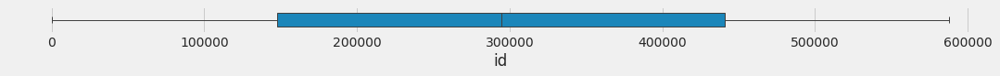

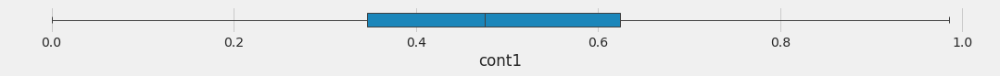

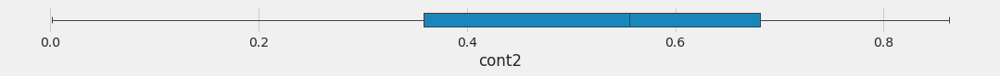

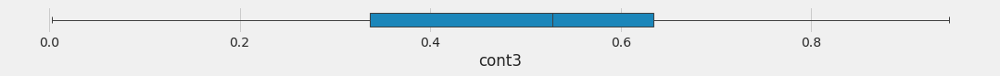

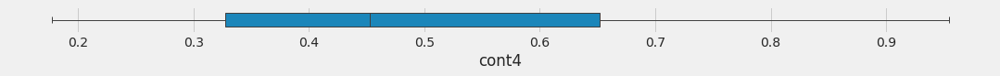

...

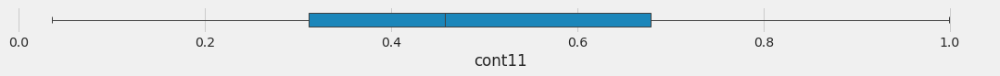

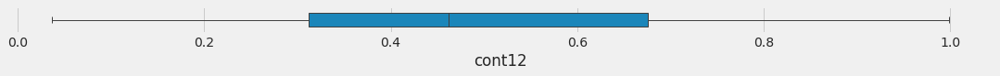

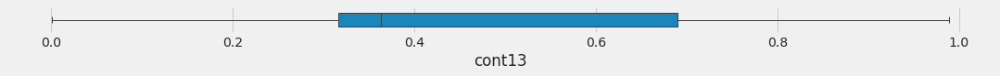

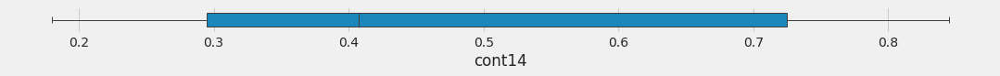

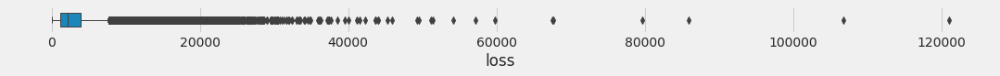

In [87]:
show_boxplot(df_train, *list_numerical_col)

---

## **Data Understanding: Statistics and Plot**

### **Data Explorate**
- Continuous feature
  - Histograms
  - Matrix correlation
- Categorical feature
  - Histograms
  - Matrix correlation
- Correlations

In [88]:
# savefig()

def save_image(img: 'matplotlib',
               name: str,
               path: str = 'reports/images/'):
    
    fig = img.get_figure()
    fig.savefig(f"reports/images/{name}.png")
    
    return f"Image {name} saved."

<br/>

### PCA (Kernel Density Estimate)

In [89]:
### Preparing data to KDE

lable = df_train['loss'].values
dataset_visual = df_train.drop(['loss'], axis = 1)
dataset_visual = df_train[list_categorical_col].values
dataset_visual = StandardScaler().fit_transform(dataset_visual)

# import some data to play
X = dataset_visual
y = df_train['loss']

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5

pca = PCA(n_components=3)
principalComponents  = pca.fit_transform(X)

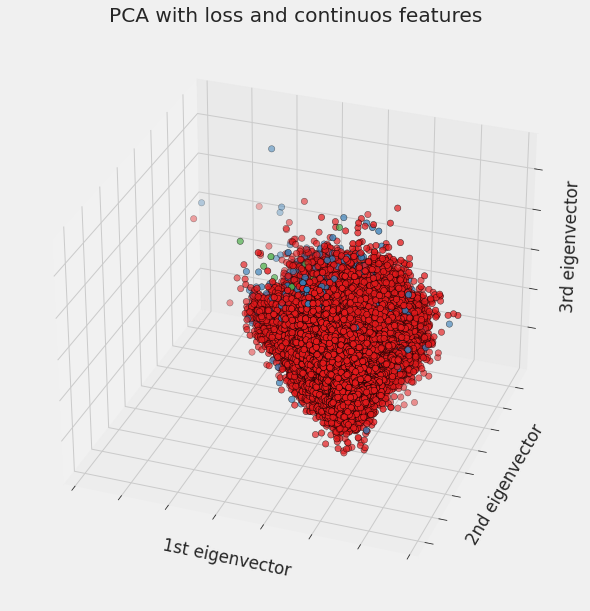

In [90]:
# Plotting a Kernel Density Estimate (KDE) with three PCA dimensions
fig3 = plt.figure(2, figsize=(12, 8))
ax2 = Axes3D(fig3, elev=-150, azim=70)
pca_img = ax2.scatter(principalComponents[:, 0],
                      principalComponents[:, 1], 
                      principalComponents[:, 2],
                      c=lable, 
                      cmap=plt.cm.Set1,
                      edgecolor='k', s=40)

ax2.set_title("PCA with loss and continuos features")
ax2.set_xlabel("1st eigenvector")
ax2.w_xaxis.set_ticklabels([])
ax2.set_ylabel("2nd eigenvector")
ax2.w_yaxis.set_ticklabels([])
ax2.set_zlabel("3rd eigenvector")
ax2.w_zaxis.set_ticklabels([])

plt.show()

In [91]:
print(pca.explained_variance_ratio_)

[0.05981928 0.04738145 0.04292431]


It is seen that the data are well grouped and presented in a PCA of 3 dimensions for each one of its components the variance of 5.97%, 4.73% and 4.29%, being a total of 14.99%.

In [92]:
save_image(img=pca_img, name='PCA')

'Image PCA saved.'

<br/>

### Histograms
In the images below there are the histograms for the **numerical data**

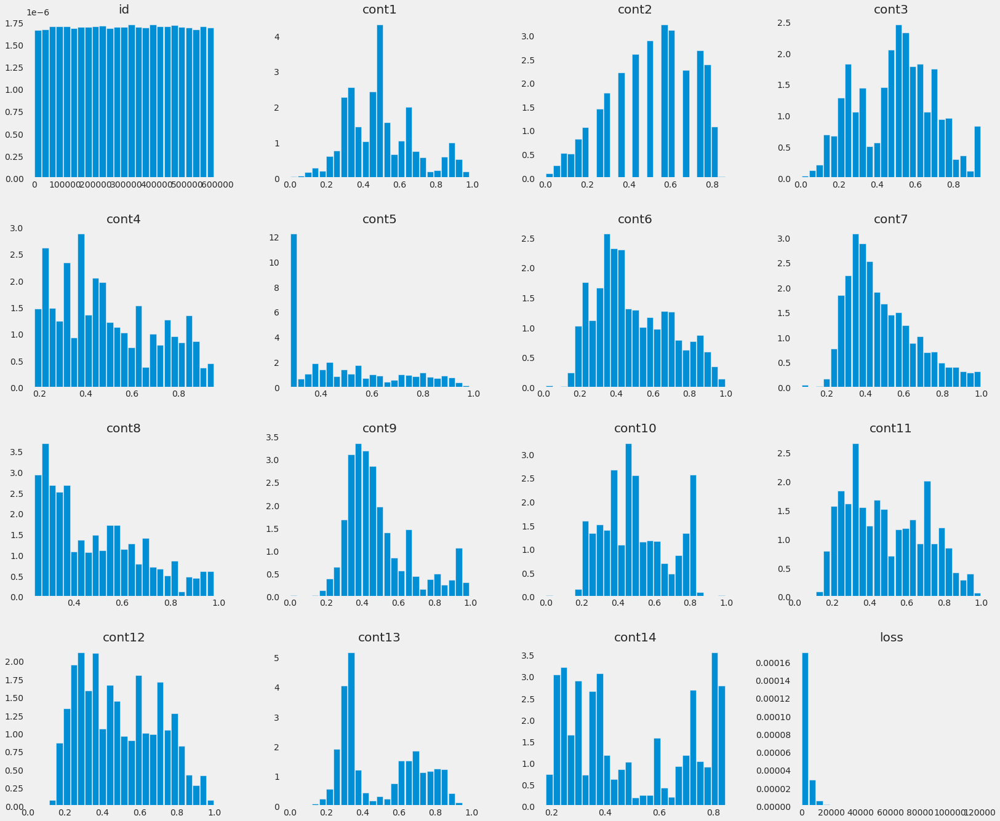

In [93]:
df_train[list_numerical_col].hist(figsize=[25,22], 
                                  density=True, 
                                  bins=25, 
                                  grid=False, 
                                  zorder=2, 
                                  rwidth=0.9);

<br/>

### Correlations
The images below show the graphs and the correlation matrix for the **numerical data**

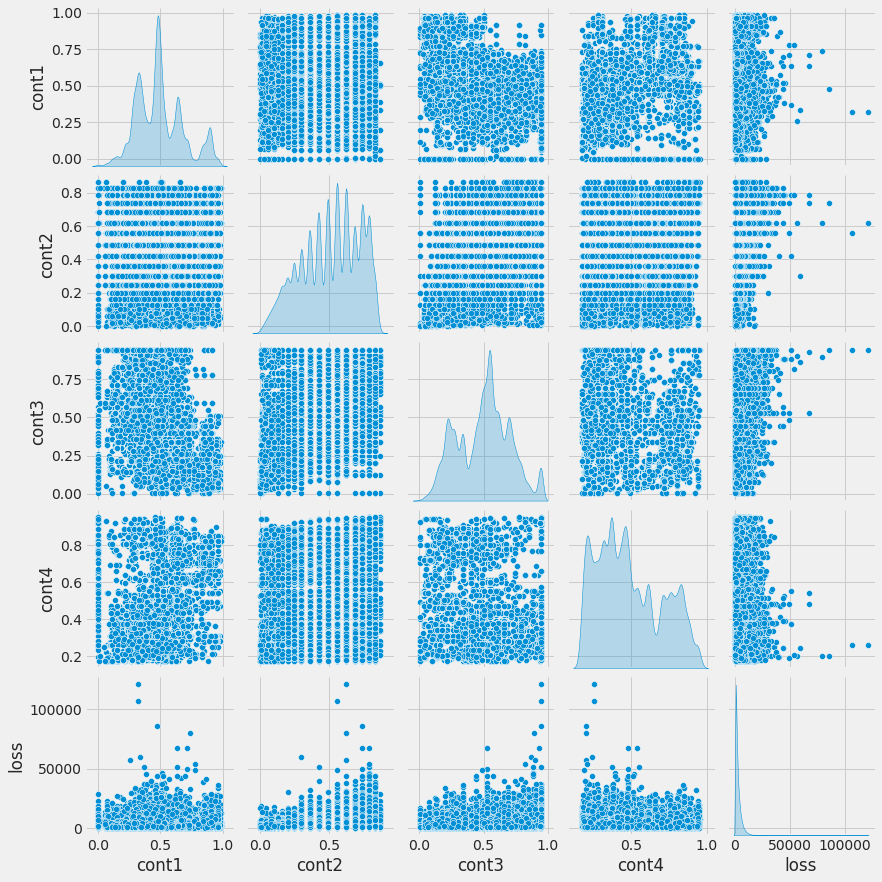

In [94]:
corr_cont_types_1_ate_4 = sns.pairplot(df_train[list_numerical_col],
                                       vars=['cont1',
                                             'cont2',
                                             'cont3',
                                             'cont4',
                                             'loss'],
                                       kind = 'scatter',
                                       diag_kind='kde')
print(corr_cont_types_1_ate_4)

In [95]:
# save image
fig = corr_cont_types_1_ate_4.fig.savefig("reports/images/corr_cont_types_1_ate_4.png")
print(f"Output (corr_cont_types_1_ate_4) saved.")

Output (corr_cont_types_1_ate_4) saved.


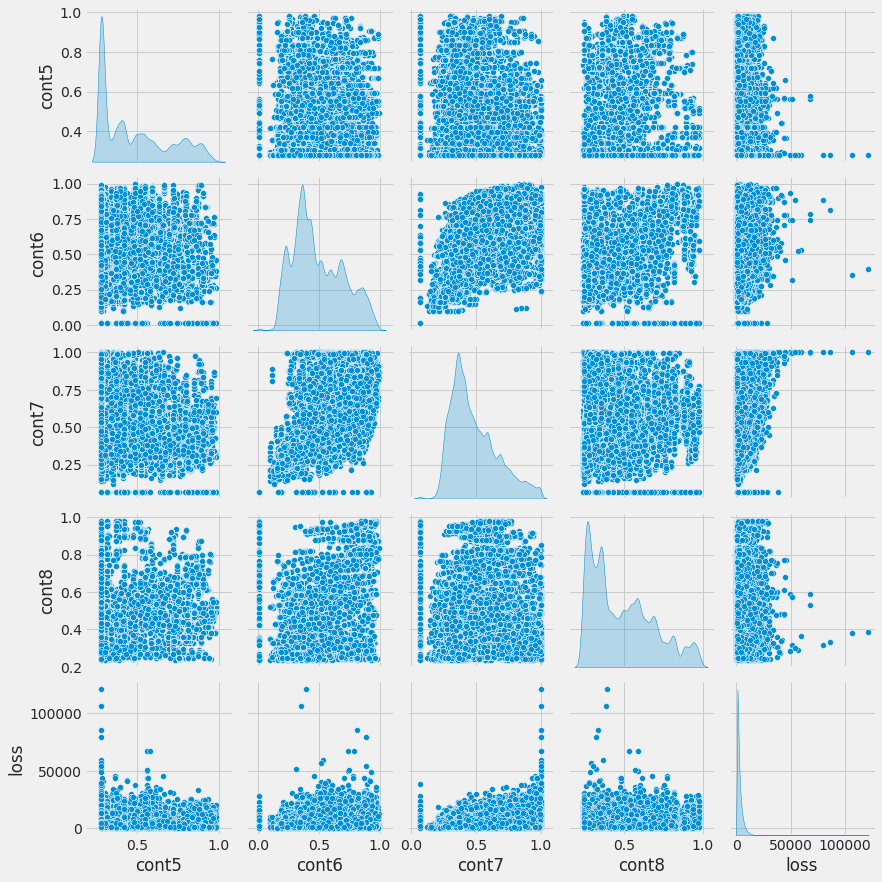

In [96]:
corr_cont_types_5_ate_8 = sns.pairplot(df_train[list_numerical_col],
                                       vars=['cont5',
                                             'cont6',
                                             'cont7',
                                             'cont8',
                                             'loss'],
                                       kind = 'scatter',
                                       diag_kind='kde')
print(corr_cont_types_5_ate_8)

In [97]:
# save image
fig = corr_cont_types_5_ate_8.savefig("reports/images/corr_cont_types_5_ate_8.png")
print(f"Output (corr_cont_types_5_ate_8) saved.")

Output (corr_cont_types_5_ate_8) saved.


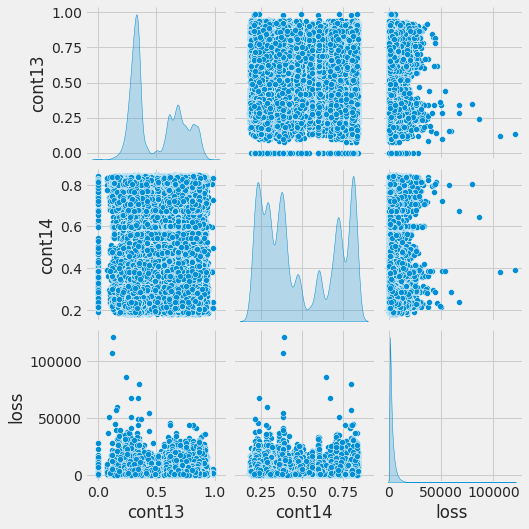

In [98]:
corr_cont_types_13_ate_14 = sns.pairplot(df_train[list_numerical_col],
                                        vars=['cont13',
                                              'cont14',
                                              'loss'],
                                        kind = 'scatter',
                                        diag_kind='kde')
print(corr_cont_types_13_ate_14)

In [99]:
# save image
fig = corr_cont_types_13_ate_14.savefig("reports/images/corr_cont_types_13_ate_14.png")
print(f"Output (corr_cont_types_13_ate_14) saved.")

Output (corr_cont_types_13_ate_14) saved.


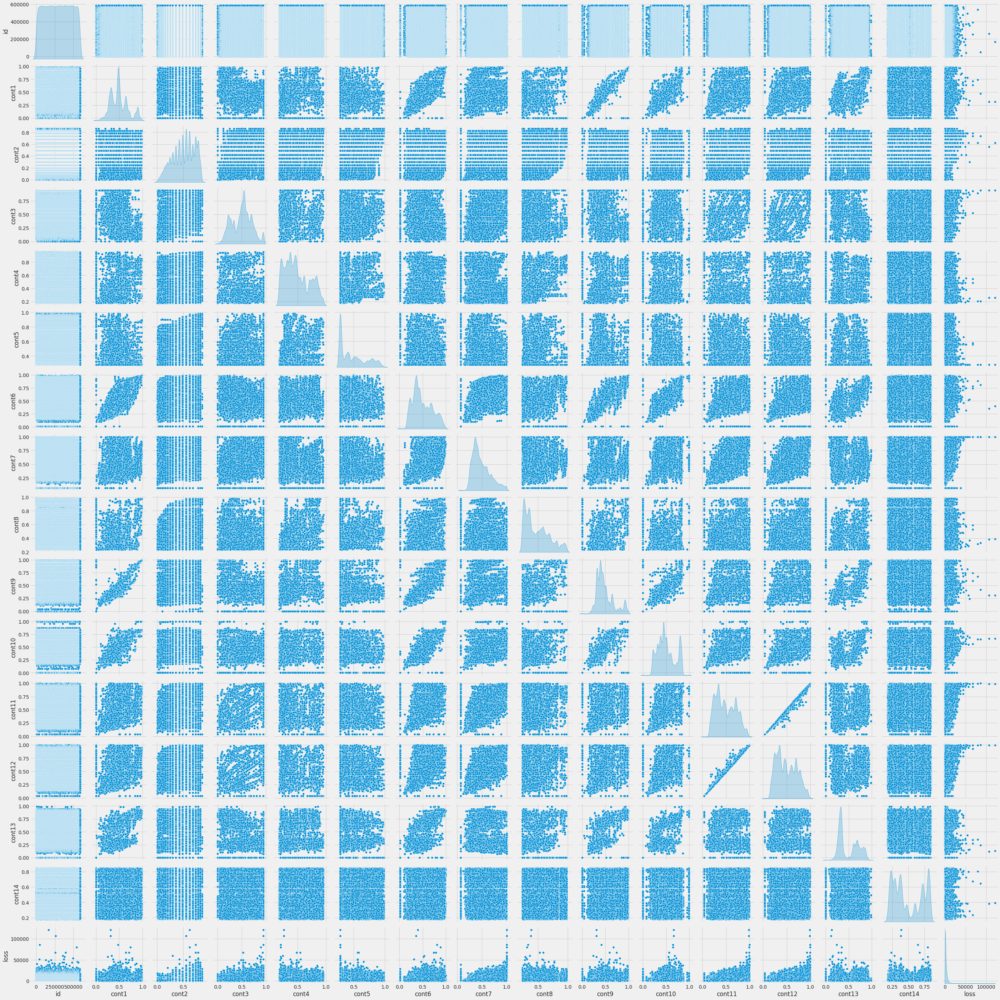

In [100]:
corr_cont_types_all = sns.pairplot(
    df_train[list_numerical_col],
    kind = 'scatter',
    diag_kind='kde')

In [101]:
# save image
fig = corr_cont_types_all.savefig("reports/images/corr_cont_types_all.png")
print(f"Output (corr_cont_types_all) saved.")

Output (corr_cont_types_all) saved.


<br/>

### Matrix correlation: continuous features

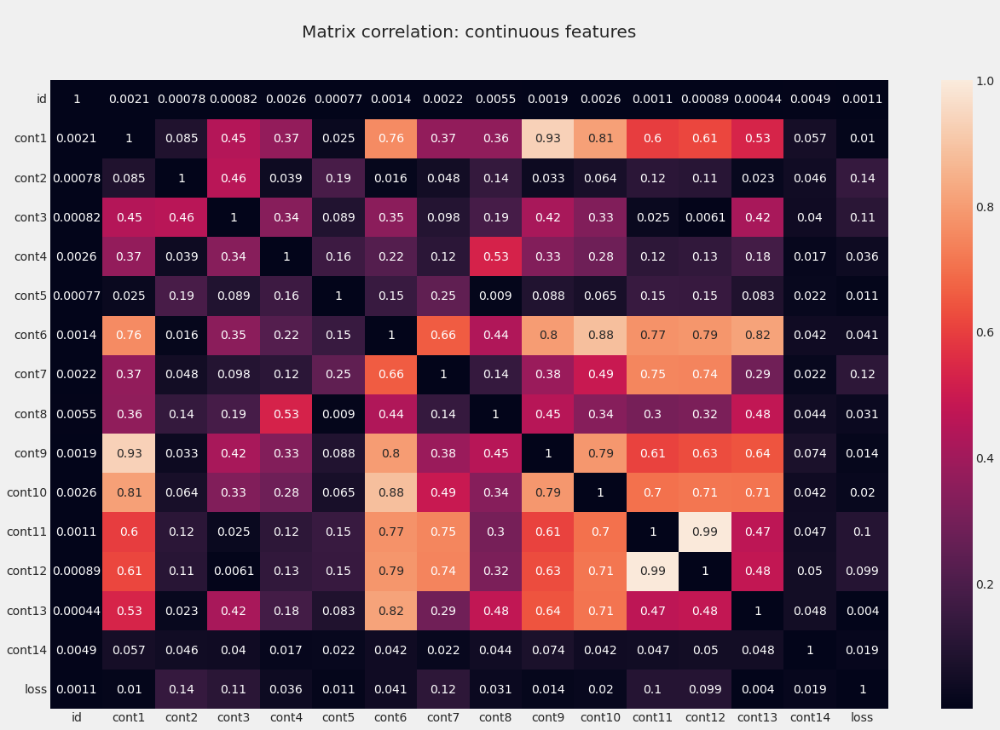

In [102]:
correlationMatrix = df_train[list_numerical_col].corr().abs()

plt.subplots(figsize=(18, 11))
plt.tight_layout() # save images without cut


sns.heatmap(correlationMatrix,annot=True)

# Mask unimportant features
corr_matrix_cont = sns.heatmap(correlationMatrix,
            mask=correlationMatrix < 1,
            cbar=False,
            linecolor='white',
            annot = True)

plt.title("\nMatrix correlation: continuous features\n\n")
plt.autoscale()
plt.show()

In [103]:
# save image
corr_matrix_cont.figure.savefig("reports/images/corr_matrix_cont.png")
print(f"Output (corr_matrix_cont) saved.")

Output (corr_matrix_cont) saved.


It`s possible see correlations exists between some of the continuous variables.
In this case, the correlations score between cont10 and cont11 is 0.7. 

<br/>

### Categorical Features: Best Correlation

In [104]:
def top_corr(df: pd.core.frame.DataFrame,
             list_col: list,
             n_corr: int = 20,
             corr_method: str = 'pearson') -> pd.core.series.Series:
    corr_top_list = df[list_col].corr(method=corr_method).abs()
    sortedSeries = corr_top_list.unstack().sort_values(kind="quicksort", ascending=False)

    print("-"*25, "TOP CORRELATED IN PAIRS", "-"*25, end='\n\n')
    return sortedSeries[sortedSeries != 1.0][0:n_corr]

In [105]:
top_corr(df=df_train,
         list_col=list_categorical_col)

------------------------- TOP CORRELATED IN PAIRS -------------------------



cat3    cat90    0.96
cat90   cat3     0.96
cat89   cat7     0.96
cat7    cat89    0.96
cat2    cat9     0.93
cat9    cat2     0.93
cat50   cat6     0.93
cat6    cat50    0.93
cat116  cat104   0.92
cat104  cat116   0.92
cat8    cat102   0.90
cat102  cat8     0.90
cat98   cat86    0.89
cat86   cat98    0.89
cat66   cat8     0.86
cat8    cat66    0.86
cat86   cat115   0.85
cat115  cat86    0.85
cat4    cat111   0.83
cat111  cat4     0.83
dtype: float64

<br/>

### Without Correlation

In [106]:
def get_without_correlation(df, list_col, target_col):
    corr_list = df[list_col].corr().abs()

    s = corr_list.unstack()
    sorted_series = s\
                    .sort_values(kind="quicksort",ascending=True)
    if sorted_series is None:
        print('All columns have correlation with target column.')
        return None
    
    without_correlation = sorted_series[sorted_series < 0.1][0:-1]

    print("-"*25, "WITHOUT CORRELATED WITH TARGET", "-"*25, end='\n\n')
    print(without_correlation)
    return without_correlation.index

In [107]:
list_without_corr = get_without_correlation(df = df_train,
                                            list_col = list_categorical_col,
                                            target_col = df_train['loss'])

------------------------- WITHOUT CORRELATED WITH TARGET -------------------------

cat7    cat26    0.00
cat26   cat7     0.00
cat56   cat100   0.00
cat100  cat56    0.00
cat14   cat21    0.00
                 ... 
cat111  cat13    0.10
cat13   cat111   0.10
cat22   cat90    0.10
cat90   cat22    0.10
cat54   cat9     0.10
Length: 12013, dtype: float64


In [108]:
len(list_without_corr)

12013

<br/>

### Numerical Features: Best Correlation

In [109]:
top_corr(df=df_train,
         list_col=list_numerical_col)

------------------------- TOP CORRELATED IN PAIRS -------------------------



cont11  cont12   0.99
cont12  cont11   0.99
cont9   cont1    0.93
cont1   cont9    0.93
cont6   cont10   0.88
cont10  cont6    0.88
cont13  cont6    0.82
cont6   cont13   0.82
cont1   cont10   0.81
cont10  cont1    0.81
cont9   cont6    0.80
cont6   cont9    0.80
cont10  cont9    0.79
cont9   cont10   0.79
cont12  cont6    0.79
cont6   cont12   0.79
        cont11   0.77
cont11  cont6    0.77
cont1   cont6    0.76
cont6   cont1    0.76
dtype: float64

#### Without Correlation

In [110]:
list_without_corr = get_without_correlation(df=df_train,
                                            list_col=list_numerical_col,
                                            target_col='loss')

------------------------- WITHOUT CORRELATED WITH TARGET -------------------------

id      cont13   0.00
cont13  id       0.00
cont5   id       0.00
id      cont5    0.00
        cont2    0.00
cont2   id       0.00
id      cont3    0.00
cont3   id       0.00
cont12  id       0.00
id      cont12   0.00
cont11  id       0.00
id      cont11   0.00
        loss     0.00
loss    id       0.00
id      cont6    0.00
cont6   id       0.00
id      cont9    0.00
cont9   id       0.00
cont1   id       0.00
id      cont1    0.00
cont7   id       0.00
id      cont7    0.00
cont4   id       0.00
id      cont4    0.00
        cont10   0.00
cont10  id       0.00
cont13  loss     0.00
loss    cont13   0.00
cont14  id       0.00
id      cont14   0.00
cont8   id       0.01
id      cont8    0.01
cont3   cont12   0.01
cont12  cont3    0.01
cont5   cont8    0.01
cont8   cont5    0.01
cont1   loss     0.01
loss    cont1    0.01
        cont5    0.01
cont5   loss     0.01
cont9   loss     0.01
loss    cont9 

---

## **Data Preparation: Feature Engineering**

In [111]:
def get_feature_importance_df(feature_importances,
                              column_names, 
                              top_n=20):
    """
    Get feature importance data frame.
 
    Parameters
    ----------
    feature_importances : numpy ndarray
        Feature importances computed by an ensemble 
            model like random forest or boosting
    column_names : array-like
        Names of the columns in the same order as feature 
            importances
    top_n : integer
        Number of top features
 
    Returns
    -------
    df : a Pandas data frame
    """
     
    imp_dict = dict(zip(column_names, feature_importances))
    
    # get name features sorted
    top_features = sorted(imp_dict, key=imp_dict.get, reverse=True)[0:top_n]
    
    # get values
    top_importances = [imp_dict[feature] for feature in top_features]
    
    # create dataframe with feature_importance
    df = pd.DataFrame(data={'feature': top_features, 'importance': top_importances})
    return df

In [112]:
list_columns.remove('loss')

In [116]:
df_train[list_columns].head(2)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,1,1,3,3,1,3,2,1,3,1,0,0,0,0,0,3,1,2,4,0,2,15,1,6,0,0,8,4,6,9,6,45,28,2,19,55,0,14,269,0.73,0.25,0.19,0.79,0.31,0.72,0.34,0.30,0.67,0.84,0.57,0.59,0.82,0.71
1,2,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,0,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,11,5,0,0,4,4,8,10,10,33,65,0,22,38,0,14,85,0.33,0.74,0.59,0.61,0.89,0.44,0.44,0.60,0.35,0.44,0.34,0.37,0.61,0.30


In [117]:
# create model

rf = RandomForestRegressor(n_estimators=df_train.shape[1], # numbers tree
                           max_depth=8,
                           min_samples_leaf=df_train.shape[1],
                           max_features=0.2, # each tree utility 20% in the features
                           n_jobs=-1)

In [118]:
# trainning model

rf.fit(df_train[list_columns], df_train['loss'])

features = df_train[list_columns].columns.values

print("---Traing Done---")

---Traing Done---


In [119]:
# get trained model (rf) and avalible the feature_importance
feature_importance = get_feature_importance_df(rf.feature_importances_, features)

# print feature_importance in the rf randomForest
display(feature_importance)

,feature,importance
0,cat80,0.22
1,cat79,0.19
2,cat87,0.08
3,cat57,0.07
4,cat101,0.06
5,cat12,0.05
6,cont2,0.04
7,cat81,0.04
8,cont7,0.03
9,cat89,0.02


[Text(0.5, 0, "Name's Variable"),
 Text(0, 0.5, 'Importance'),
 Text(0.5, 1.0, 'Variable Importances')]

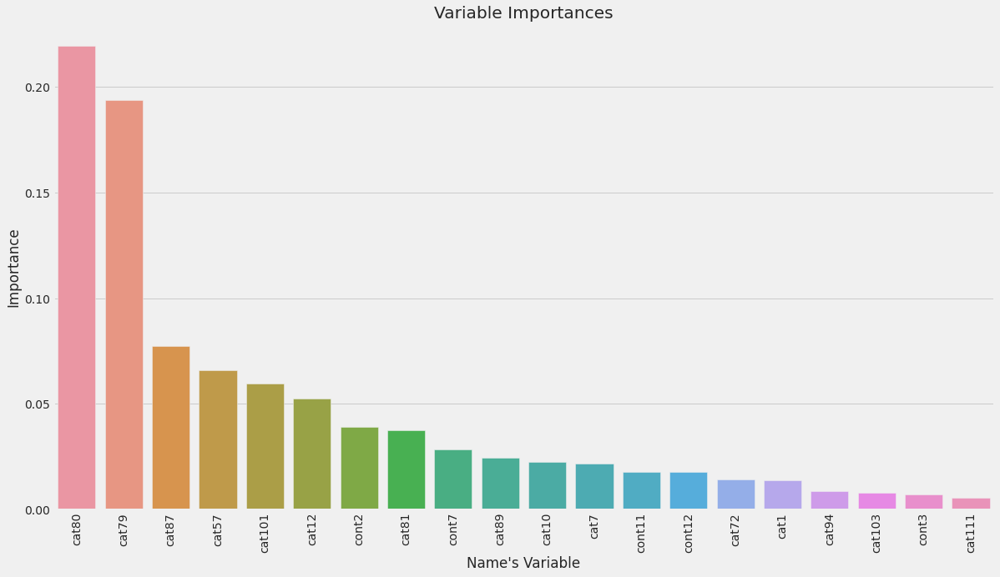

In [120]:
fig,ax = plt.subplots()
plt.xticks(rotation='vertical')

fig.set_size_inches(18,10)
sns.barplot(data=feature_importance[:20], 
            x="feature", 
            y="importance", 
            ax=ax)
ax.set(xlabel="Name's Variable",
       ylabel='Importance',
       title="Variable Importances")

<br/>

### Drop Feature Without Importance and Without Correlation

In [121]:
def get_without_importance(df_feature_importance: pd.core.frame.DataFrame) -> list:
    list_drop_col = []
              
    cond_duracao = (df_feature_importance['importance'] < 0.01)
    df_temp = df_feature_importance[cond_duracao]
    
    list_drop_col = df_temp['feature'].tolist()
    
    print("-"*25, "FEATURE WITHOUT IMPORTANCE", "-"*25, end='\n\n')
    print(df_temp)
    return list_drop_col

In [122]:
def remove_without_importace(df: pd.core.frame.DataFrame, list_without_imp: list) -> int:
    print(f'Columns before = {df.shape[1]}')
    
    for column in list_without_imp:
        del df[column]
        
    return print(f"Columns after = {df.shape[1]}")

In [123]:
def remove_without_corr(df: pd.core.frame.DataFrame, list_without_corr: list) -> int:
    print(f'Columns before = {df.shape[1]}')

    for column in list_without_corr:
        del df[column]
    
    return print(f"Columns after = {df.shape[1]}")

In [554]:
remove_without_corr(df_train, list_without_corr[1])

Columns before = 132
Columns after = 130


In [555]:
list_without_importance = get_without_importance(df_feature_importance = feature_importance)

------------------------- FEATURE WITHOUT IMPORTANCE -------------------------

   feature  importance
16    cat2        0.01
17   cont3        0.01
18   cat94        0.01
19  cat103        0.01


In [556]:
remove_without_importace(df = df_train,
                        list_without_imp = list_without_importance)

Columns before = 130
Columns after = 126


In [557]:
list_numerical_col = get_col(df=df_train,
                             type_descr=np.number)
list_categorical_col = get_col(df=df_train,
                               type_descr=np.object)
list_columns = get_col(df=df_train,
                       type_descr=[np.object, np.number])

Dataframe not contains <class 'object'> columns !


---

## **Save Clean Data**

In [558]:
def save_data_clenning(df: pd.core.frame.DataFrame,
                       path: str = 'data/cleansing/') -> None:
    df.to_csv(path_or_buf = path,
              sep = ',',
              index = False,
              encoding = 'utf8')
    
    return "saved data!"

In [559]:
save_data_clenning(df = df_train,
                   path = 'data/cleansing/train.csv')

save_data_clenning(df = df_test,
                   path = 'data/cleansing/test.csv')

'saved data!'

---